In [1]:
!git clone https://github.com/Hamzaabba2005/Dissertation.git

Cloning into 'Dissertation'...
remote: Enumerating objects: 110, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 110 (delta 12), reused 21 (delta 7), pack-reused 84 (from 1)
Receiving objects: 100% (110/110), 22.06 MiB | 31.59 MiB/s, done.
Resolving deltas: 100% (37/37), done.


In [2]:
import sys
sys.path.append("/kaggle/working/Dissertation/src")

In [3]:
# configuration
from config import *

# reproducibility
from reproducibility import seed_everything

# dataset utilities
from auto_detect import pick_images_dir
from build_samples import build_samples_existing
from patient_level_split import patient_level_split

# transforms
from transforms_config import get_transforms

# dataloaders
from dataset import create_dataloaders

# class imbalance handling
from class_weights import compute_pos_weight

# models
from model import build_model

from thresholds import (
    tune_thresholds_per_class,
    predict_with_thresholds,
    evaluate_with_thresholds,
    threshold_report,
)


In [4]:
import os
import random
import copy
import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import f1_score

In [5]:
from config import *

BASE_PATH = os.getenv("DATASET_PATH", "/kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k")
CSV_PATH = os.path.join(BASE_PATH, "full_df.csv")
IMAGES_DIR = os.path.join(BASE_PATH, "preprocessed_images")

print("CSV exists:", os.path.exists(CSV_PATH))
print("Images dir exists:", os.path.exists(IMAGES_DIR))
print("Device:", DEVICE)

CSV exists: True
Images dir exists: True
Device: cuda


In [6]:
print("CUDA available:", torch.cuda.is_available())
print("Device count:", torch.cuda.device_count())
print("Current device:", torch.cuda.current_device() if torch.cuda.is_available() else "CPU")
print("GPU name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")

CUDA available: True
Device count: 1
Current device: 0
GPU name: Tesla P100-PCIE-16GB


In [7]:
from reproducibility import seed_everything

SEED = 42
seed_everything(SEED)

In [8]:
df = pd.read_csv(CSV_PATH)
print("CSV shape:", df.shape)
(df.head())

CSV shape: (6392, 19)


,ID,Patient Age,Patient Sex,Left-Fundus,Right-Fundus,Left-Diagnostic Keywords,Right-Diagnostic Keywords,N,D,G,C,A,H,M,O,filepath,labels,target,filename
0,0,69,Female,0_left.jpg,0_right.jpg,cataract,normal fundus,0,0,0,1,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",0_right.jpg
1,1,57,Male,1_left.jpg,1_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",1_right.jpg
2,2,42,Male,2_left.jpg,2_right.jpg,laser spot，moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",2_right.jpg
3,4,53,Male,4_left.jpg,4_right.jpg,macular epiretinal membrane,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",4_right.jpg
4,5,50,Female,5_left.jpg,5_right.jpg,moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",5_right.jpg


In [9]:
from auto_detect import pick_images_dir

auto_dir, hits = pick_images_dir(BASE_PATH, df)

if auto_dir is not None and hits > 0:
    IMAGES_DIR = auto_dir

print("Selected IMAGES_DIR:", IMAGES_DIR)
print("Hits:", hits)

Selected IMAGES_DIR: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images
Hits: 39


In [10]:
from build_samples import build_samples_existing

samples, missing, bad_labels = build_samples_existing(
    df,
    IMAGES_DIR,
    LABEL_COLS
)

print("Total usable samples:", len(samples))
print("Missing images:", missing)
print("Bad label rows:", bad_labels)

Total usable samples: 12460
Missing images: 324
Bad label rows: 0


In [11]:
from patient_level_split import patient_level_split

train_samples, val_samples = patient_level_split(
    samples,
    VAL_SIZE,
    SEED
)

train_patients = set(s["patient_id"] for s in train_samples)
val_patients = set(s["patient_id"] for s in val_samples)

print("Train samples:", len(train_samples))
print("Val samples:", len(val_samples))
print("Unique train patients:", len(train_patients))
print("Unique val patients:", len(val_patients))
print("Patient overlap:", len(train_patients & val_patients))


Train samples: 10609
Val samples: 1851
Unique train patients: 2854
Unique val patients: 504
Patient overlap: 0


In [12]:
from transforms_config import get_transforms

train_tfm, val_tfm = get_transforms(IMG_SIZE)

In [13]:
from dataset import create_dataloaders

train_ds, val_ds, train_loader, val_loader = create_dataloaders(
    train_samples,
    val_samples,
    train_tfm,
    val_tfm
)
print("Dataset sizes:", len(train_ds), len(val_ds))

Dataset sizes: 10609 1851


In [14]:
from class_weights import compute_pos_weight

pos_weight = compute_pos_weight(train_samples).to(DEVICE)
print("pos_weight:", pos_weight)

pos_weight: tensor([ 2.0054,  1.9486, 15.4481, 14.5102, 19.0170, 30.9548, 20.0496,  3.3640],
       device='cuda:0')


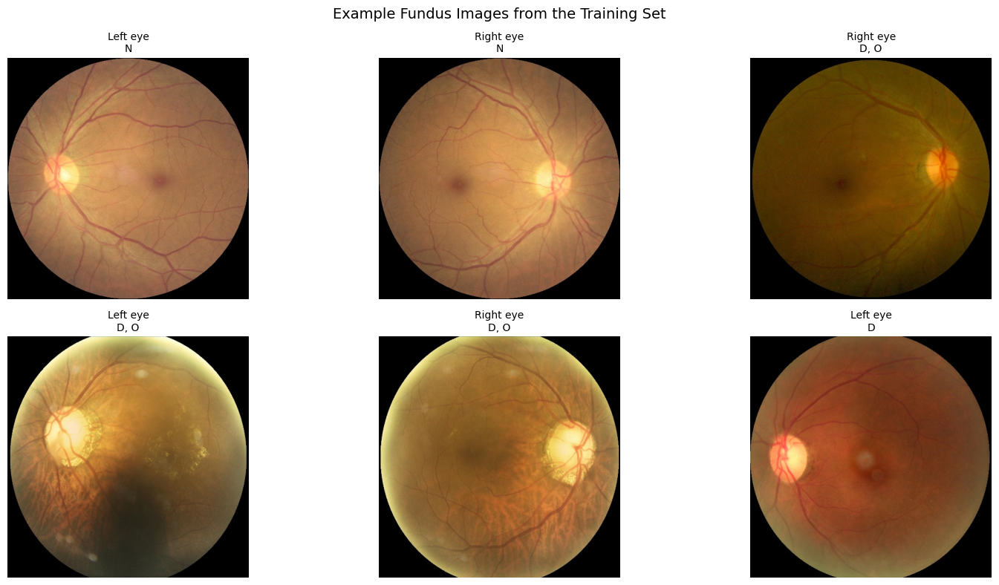

In [15]:
import matplotlib.pyplot as plt
from PIL import Image

def show_sample_images(samples, n=6):
    n = min(n, len(samples))
    fig, axes = plt.subplots(2, (n + 1) // 2, figsize=(16, 8))
    axes = np.array(axes).reshape(-1)

    for ax, sample in zip(axes, samples[:n]):
        img = Image.open(sample["path"]).convert("RGB")
        ax.imshow(img)
        positive_labels = [LABEL_COLS[i] for i, v in enumerate(sample["label"]) if v > 0]
        ax.set_title(f"{sample['side']} eye\n" + ", ".join(positive_labels), fontsize=10)
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    plt.suptitle("Example Fundus Images from the Training Set", fontsize=14)
    plt.tight_layout()
    plt.show()

show_sample_images(train_samples, n=6)

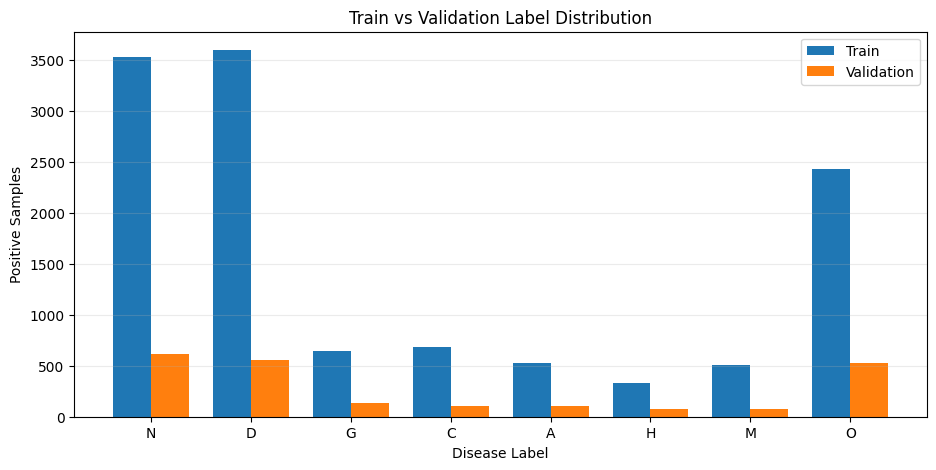

In [16]:
import matplotlib.pyplot as plt

train_label_counts = np.stack([s["label"] for s in train_samples]).sum(axis=0)
val_label_counts = np.stack([s["label"] for s in val_samples]).sum(axis=0)

x = np.arange(len(LABEL_COLS))
width = 0.38

plt.figure(figsize=(11, 5))
plt.bar(x - width/2, train_label_counts, width=width, label="Train")
plt.bar(x + width/2, val_label_counts, width=width, label="Validation")
plt.xticks(x, LABEL_COLS)
plt.title("Train vs Validation Label Distribution")
plt.xlabel("Disease Label")
plt.ylabel("Positive Samples")
plt.legend()
plt.grid(axis="y", alpha=0.25)
plt.show()


In [17]:
from model import build_model
import torch.nn as nn
import torch
import torch.nn.functional as F

MODEL_NAME = "efficientnet_b0"
# options: "resnet18", "resnet50", "efficientnet_b0", "custom_cnn"

def smooth_bce_loss(logits, targets, pos_weight, smoothing=0.05):
    targets_smooth = targets * (1 - smoothing) + 0.5 * smoothing
    return F.binary_cross_entropy_with_logits(
        logits, targets_smooth, pos_weight=pos_weight
    )

model = build_model(
    model_name=MODEL_NAME,
    num_labels=len(LABEL_COLS),
    dropout=0.45,
    pretrained=(MODEL_NAME != "custom_cnn")
).to(DEVICE)

criterion = lambda logits, targets: smooth_bce_loss(logits, targets, pos_weight)

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=EPOCHS, eta_min=1e-6
)

print("Using model:", MODEL_NAME)
print(model.__class__.__name__)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 132MB/s] 


Using model: efficientnet_b0
EfficientNet


In [18]:
@torch.no_grad()
def multilabel_accuracy_from_probs(probs, y, threshold=0.3):
    preds = (probs >= threshold).to(y.dtype)
    return (preds == y).float().mean().item()

def train_one_epoch(model, loader, criterion, optimizer, device ="cpu"):
    model.train()
    total_loss = 0.0
    total_acc = 0.0
    n = 0

    for x, y in loader:
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True).float()

        optimizer.zero_grad(set_to_none=True)
        logits = model(x)
        loss = criterion(logits, y)
        loss.backward()
        optimizer.step()

        probs = torch.sigmoid(logits)
        bs = x.size(0)
        total_loss += loss.item() * bs
        total_acc += multilabel_accuracy_from_probs(probs, y) * bs
        n += bs

    return {
        "loss": total_loss / n,
        "acc": total_acc / n,
    }


@torch.no_grad()
def evaluate_epoch(model, loader, criterion, device="cpu", threshold=0.5):
    model.eval()
    total_loss = 0.0
    total_acc = 0.0
    n = 0
    all_probs = []
    all_targets = []

    for x, y in loader:
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True).float()

        logits = model(x)
        loss = criterion(logits, y)
        probs = torch.sigmoid(logits)

        bs = x.size(0)
        total_loss += loss.item() * bs
        total_acc += multilabel_accuracy_from_probs(probs, y, threshold=threshold) * bs
        n += bs

        all_probs.append(probs.cpu())
        all_targets.append(y.cpu())

    probs = torch.cat(all_probs).numpy()
    targets = torch.cat(all_targets).numpy().astype(int)
    preds = (probs >= threshold).astype(int)

    macro_f1 = f1_score(targets, preds, average="macro", zero_division=0)
    micro_f1 = f1_score(targets, preds, average="micro", zero_division=0)
    exact_match = (preds == targets).all(axis=1).mean()
    per_class_f1 = f1_score(targets, preds, average=None, zero_division=0)

    return {
        "loss": total_loss / n,
        "acc": total_acc / n,
        "macro_f1": macro_f1,
        "micro_f1": micro_f1,
        "exact_match": exact_match,
        "per_class_f1": per_class_f1,
        "probs": probs,
        "preds": preds,
        "targets": targets,
    }
best_val_loss = float("inf")
best_epoch_loss = -1
best_state_loss = None

best_val_macro_f1 = -1.0
best_epoch_f1 = -1
best_state_f1 = None
best_metrics_f1 = None

history = []

EARLY_STOPPING_PATIENCE = 5
epochs_no_improve = 0

for epoch in range(1, EPOCHS + 1):
    
    train_metrics = train_one_epoch(
        model, train_loader, criterion,
        optimizer=optimizer, device=DEVICE
    )

     # Evaluate model normally
    val_metrics = evaluate_epoch(
        model,
        val_loader,
        criterion,
        device=DEVICE,
        threshold=0.5
    )
    
    # Tune thresholds
    best_thresholds, tuned_per_class_f1 = tune_thresholds_per_class(
        val_metrics["probs"],
        val_metrics["targets"]
    )
    
    # Evaluate with tuned thresholds
    tuned_metrics = evaluate_with_thresholds(
        val_metrics["probs"],
        val_metrics["targets"],
        best_thresholds
    )

    scheduler.step()
    current_lr = optimizer.param_groups[0]["lr"]

    history.append({
        "epoch": epoch,
        "train_loss": train_metrics["loss"],
        "train_acc": train_metrics["acc"],
        "val_loss": val_metrics["loss"],
        "val_acc": val_metrics["acc"],
        "val_macro_f1": val_metrics["macro_f1"],
        "val_micro_f1": val_metrics["micro_f1"],
        "val_exact_match": val_metrics["exact_match"],
        "lr": current_lr,
    })

    print(
        f"Epoch {epoch:02d} | "
        f"train loss {train_metrics['loss']:.4f} acc {train_metrics['acc']:.4f} | "
        f"val loss {val_metrics['loss']:.4f} acc {val_metrics['acc']:.4f} | "
        f"macro_f1@0.5 {val_metrics['macro_f1']:.4f} | "
        f"macro_f1_tuned {tuned_metrics['macro_f1']:.4f} | "
        f"exact_tuned {tuned_metrics['exact_match']:.4f} | "
        f"lr {current_lr:.6f}"
    )

    if val_metrics["loss"] < best_val_loss:
        best_val_loss = val_metrics["loss"]
        best_epoch_loss = epoch
        best_state_loss = copy.deepcopy(model.state_dict())

    improved_f1 = (
        val_metrics["macro_f1"] > best_val_macro_f1
    ) or (
        np.isclose(val_metrics["macro_f1"], best_val_macro_f1) and
        val_metrics["loss"] < (best_metrics_f1["loss"] if best_metrics_f1 is not None else float("inf"))
    )

    if improved_f1:
        best_val_macro_f1 = val_metrics["macro_f1"]
        best_epoch_f1 = epoch
        best_state_f1 = copy.deepcopy(model.state_dict())
        best_metrics_f1 = {
            "loss": val_metrics["loss"],
            "acc@0.5": val_metrics["acc"],
            "macro_f1@0.5": val_metrics["macro_f1"],
            "micro_f1@0.5": val_metrics["micro_f1"],
            "exact@0.5": val_metrics["exact_match"],
            "per_class_f1@0.5": val_metrics["per_class_f1"],
            "macro_f1_tuned": tuned_metrics["macro_f1"],
            "micro_f1_tuned": tuned_metrics["micro_f1"],
            "exact_tuned": tuned_metrics["exact_match"],
            "per_class_f1_tuned": tuned_metrics["per_class_f1"],
        }
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1
        print(f"No macro F1 improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= EARLY_STOPPING_PATIENCE:
        print(
            f"Early stopping triggered at epoch {epoch}. "
            f"Best macro F1: {best_val_macro_f1:.4f} at epoch {best_epoch_f1}."
        )
        break

Epoch 01 | train loss 1.2681 acc 0.1549 | val loss 1.2322 acc 0.5359 | macro_f1@0.5 0.3077 | macro_f1_tuned 0.4585 | exact_tuned 0.0373 | lr 0.000050
Epoch 02 | train loss 1.1825 acc 0.1968 | val loss 1.1825 acc 0.5658 | macro_f1@0.5 0.3367 | macro_f1_tuned 0.5127 | exact_tuned 0.0762 | lr 0.000050
Epoch 03 | train loss 1.1495 acc 0.2219 | val loss 1.1622 acc 0.6066 | macro_f1@0.5 0.3484 | macro_f1_tuned 0.5198 | exact_tuned 0.1183 | lr 0.000050
Epoch 04 | train loss 1.1242 acc 0.2464 | val loss 1.1472 acc 0.6397 | macro_f1@0.5 0.3647 | macro_f1_tuned 0.5510 | exact_tuned 0.1480 | lr 0.000050
Epoch 05 | train loss 1.1059 acc 0.2623 | val loss 1.1411 acc 0.6571 | macro_f1@0.5 0.3625 | macro_f1_tuned 0.5616 | exact_tuned 0.1642 | lr 0.000050
No macro F1 improvement for 1 epoch(s)
Epoch 06 | train loss 1.0894 acc 0.2796 | val loss 1.1418 acc 0.6750 | macro_f1@0.5 0.3688 | macro_f1_tuned 0.5560 | exact_tuned 0.0935 | lr 0.000050
Epoch 07 | train loss 1.0797 acc 0.2847 | val loss 1.1388 acc

In [19]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_multilabel_confusion_matrices(targets, preds, class_names=None):
    num_classes = targets.shape[1]

    if class_names is None:
        class_names = [f"Class {i}" for i in range(num_classes)]

    cols = 4
    rows = int(np.ceil(num_classes / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))
    axes = axes.flatten()

    for i in range(num_classes):
        cm = confusion_matrix(targets[:, i], preds[:, i])

        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(ax=axes[i], colorbar=False)

        axes[i].set_title(class_names[i])

    for j in range(num_classes, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

In [20]:
checkpoint_dir = "/kaggle/working/checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

best_model_f1_path = os.path.join(checkpoint_dir, "resnet18_odir_multilabel_best_f1.pt")
best_model_loss_path = os.path.join(checkpoint_dir, "resnet18_odir_multilabel_best_loss.pt")
last_model_path = os.path.join(checkpoint_dir, "resnet18_odir_multilabel_last.pt")
history_path = os.path.join(checkpoint_dir, "training_history.csv")

if best_state_f1 is not None:
    torch.save(best_state_f1, best_model_f1_path)
if best_state_loss is not None:
    torch.save(best_state_loss, best_model_loss_path)
torch.save(model.state_dict(), last_model_path)
pd.DataFrame(history).to_csv(history_path, index=False)

print(f"Best epoch by tuned macro F1: {best_epoch_f1}")
if best_metrics_f1 is not None:
    print(f"Best val macro F1 @0.5: {best_metrics_f1['macro_f1@0.5']:.4f}")
    print(f"Best val macro F1 tuned: {best_metrics_f1['macro_f1_tuned']:.4f}")
    print(f"Val loss at best F1 epoch: {best_metrics_f1['loss']:.4f}")
    print(f"Val acc at best F1 epoch @0.5: {best_metrics_f1['acc@0.5']:.4f}")
    print(f"Val exact match at best F1 epoch @0.5: {best_metrics_f1['exact@0.5']:.4f}")
    print(f"Val exact match at best F1 epoch tuned: {best_metrics_f1['exact_tuned']:.4f}")

print(f"Best epoch by val loss: {best_epoch_loss}")
print(f"Best val loss: {best_val_loss:.4f}")
print("Saved best F1 model to:", best_model_f1_path)
print("Saved best loss model to:", best_model_loss_path)
print("Saved last model to:", last_model_path)
print("Saved history to:", history_path)

Best epoch by tuned macro F1: 47
Best val macro F1 @0.5: 0.4707
Best val macro F1 tuned: 0.5739
Val loss at best F1 epoch: 1.2654
Val acc at best F1 epoch @0.5: 0.8162
Val exact match at best F1 epoch @0.5: 0.2507
Val exact match at best F1 epoch tuned: 0.3020
Best epoch by val loss: 10
Best val loss: 1.1369
Saved best F1 model to: /kaggle/working/checkpoints/resnet18_odir_multilabel_best_f1.pt
Saved best loss model to: /kaggle/working/checkpoints/resnet18_odir_multilabel_best_loss.pt
Saved last model to: /kaggle/working/checkpoints/resnet18_odir_multilabel_last.pt
Saved history to: /kaggle/working/checkpoints/training_history.csv


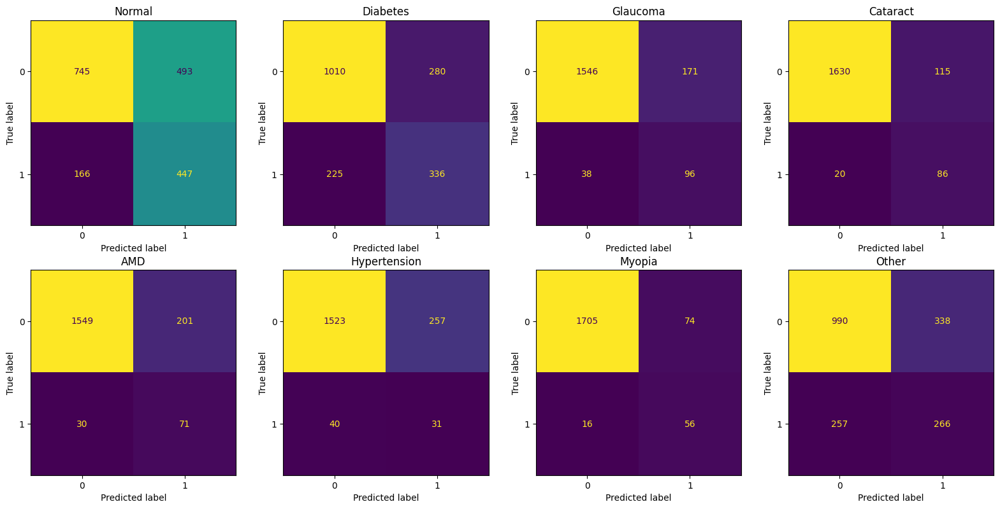

In [21]:
model.load_state_dict(best_state_f1)

val_metrics = evaluate_epoch(
    model, val_loader, criterion,
    device=DEVICE, threshold=0.5
)

plot_multilabel_confusion_matrices(
    val_metrics["targets"],
    val_metrics["preds"],
    class_names=["Normal", "Diabetes", "Glaucoma", "Cataract", "AMD", "Hypertension", "Myopia", "Other"]  # adjust
)


Class             ROC-AUC  Avg Precision
------------------------------------------
Normal             0.7304         0.5537
Diabetes           0.7503         0.6507
Glaucoma           0.8390         0.4834
Cataract           0.9087         0.7498
AMD                0.8334         0.6015
Hypertension       0.6298         0.1633
Myopia             0.8950         0.7477
Other              0.6690         0.4969
------------------------------------------
Macro Average      0.7819         0.5559


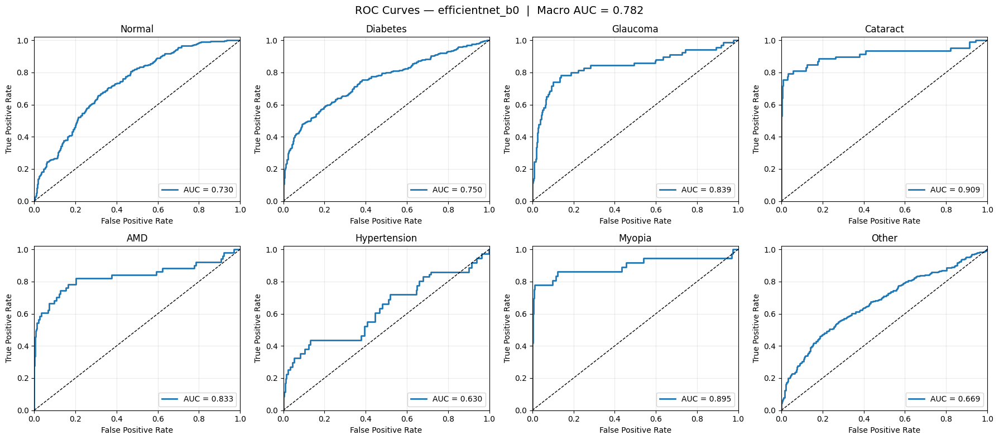

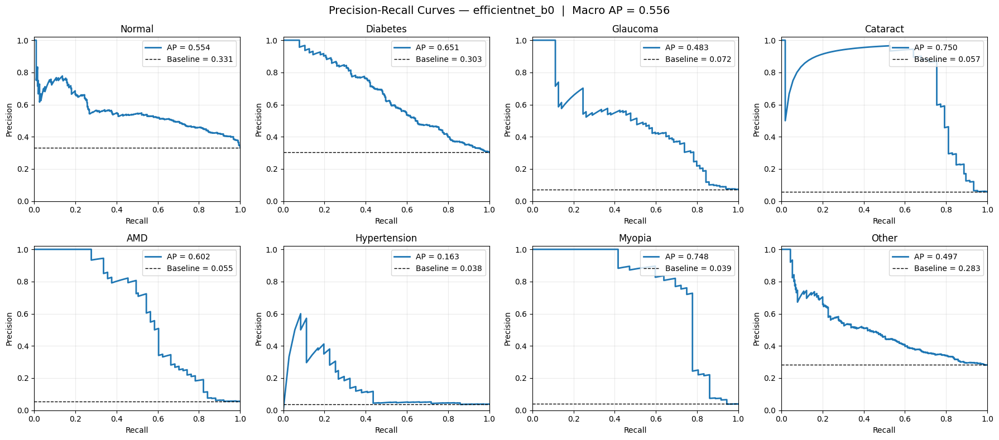

In [22]:
# ── ROC-AUC & Precision-Recall Curves ─────────────────────────────────────────
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import (
    roc_auc_score, roc_curve,
    average_precision_score, precision_recall_curve
)

CLASS_NAMES = ["Normal", "Diabetes", "Glaucoma", "Cataract", "AMD", "Hypertension", "Myopia", "Other"]

probs   = val_metrics["probs"]    # shape (N, 8)  – float
targets = val_metrics["targets"]  # shape (N, 8)  – int

# ── Per-class scores ───────────────────────────────────────────────────────────
roc_aucs = []
avg_precs = []

for i, name in enumerate(CLASS_NAMES):
    # Skip classes with only one label present (can't compute AUC)
    if len(np.unique(targets[:, i])) < 2:
        print(f"[WARNING] {name}: only one class present – AUC skipped")
        roc_aucs.append(float("nan"))
        avg_precs.append(float("nan"))
        continue
    roc_aucs.append(roc_auc_score(targets[:, i], probs[:, i]))
    avg_precs.append(average_precision_score(targets[:, i], probs[:, i]))

macro_auc = np.nanmean(roc_aucs)
macro_ap  = np.nanmean(avg_precs)

# ── Summary table ──────────────────────────────────────────────────────────────
print(f"\n{'Class':<16} {'ROC-AUC':>8} {'Avg Precision':>14}")
print("-" * 42)
for name, auc, ap in zip(CLASS_NAMES, roc_aucs, avg_precs):
    print(f"{name:<16} {auc:>8.4f} {ap:>14.4f}")
print("-" * 42)
print(f"{'Macro Average':<16} {macro_auc:>8.4f} {macro_ap:>14.4f}")

# ── ROC Curves ─────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(18, 8))
axes = axes.flatten()

for i, (name, auc) in enumerate(zip(CLASS_NAMES, roc_aucs)):
    ax = axes[i]
    if np.isnan(auc):
        ax.set_title(f"{name}\n(skipped)")
        ax.axis("off")
        continue

    fpr, tpr, _ = roc_curve(targets[:, i], probs[:, i])
    ax.plot(fpr, tpr, lw=2, label=f"AUC = {auc:.3f}")
    ax.plot([0, 1], [0, 1], "k--", lw=1)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1.02)
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.set_title(name)
    ax.legend(loc="lower right")
    ax.grid(alpha=0.25)

plt.suptitle(f"ROC Curves — {MODEL_NAME}  |  Macro AUC = {macro_auc:.3f}", fontsize=14)
plt.tight_layout()
plt.show()

# ── Precision-Recall Curves ────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(18, 8))
axes = axes.flatten()

for i, (name, ap) in enumerate(zip(CLASS_NAMES, avg_precs)):
    ax = axes[i]
    if np.isnan(ap):
        ax.set_title(f"{name}\n(skipped)")
        ax.axis("off")
        continue

    prec, rec, _ = precision_recall_curve(targets[:, i], probs[:, i])
    baseline = targets[:, i].mean()          # positive rate = random classifier baseline
    ax.plot(rec, prec, lw=2, label=f"AP = {ap:.3f}")
    ax.axhline(baseline, color="k", linestyle="--", lw=1, label=f"Baseline = {baseline:.3f}")
    ax.set_xlim(0, 1); ax.set_ylim(0, 1.02)
    ax.set_xlabel("Recall")
    ax.set_ylabel("Precision")
    ax.set_title(name)
    ax.legend(loc="upper right")
    ax.grid(alpha=0.25)

plt.suptitle(f"Precision-Recall Curves — {MODEL_NAME}  |  Macro AP = {macro_ap:.3f}", fontsize=14)
plt.tight_layout()
plt.show()

Glaucoma example index: 30


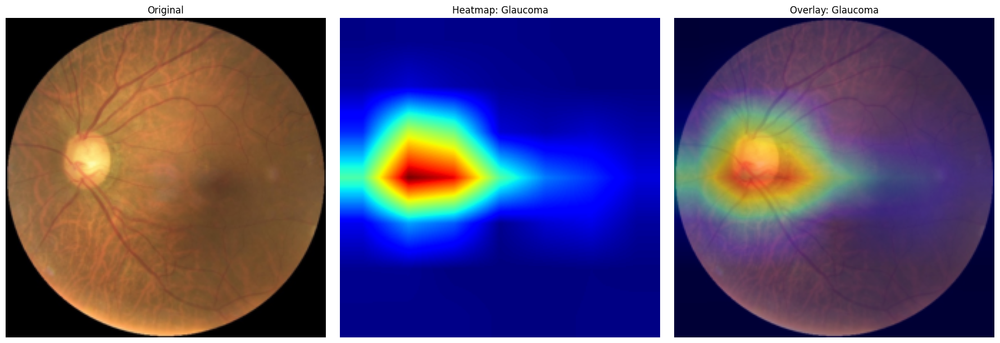

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/95_left.jpg
True: ['Glaucoma', 'Hypertension']
Pred: ['Glaucoma']

Probabilities:
        Normal: 0.2428
      Diabetes: 0.1898
      Glaucoma: 0.9822
      Cataract: 0.2074
           AMD: 0.2975
  Hypertension: 0.3209
        Myopia: 0.3584
         Other: 0.3216
AMD example index: 14


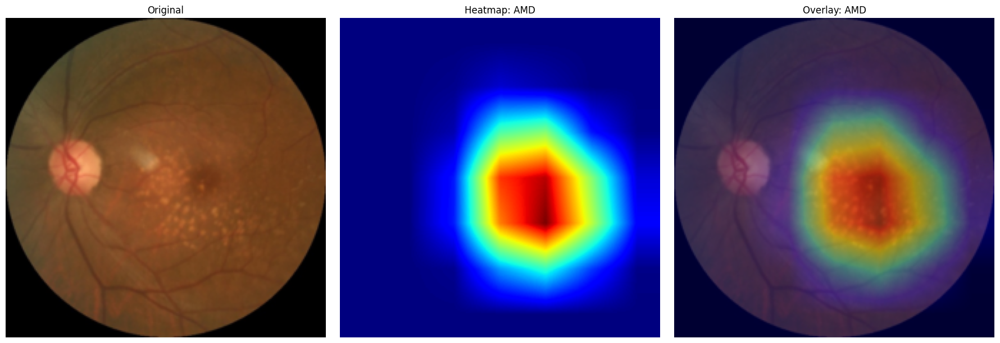

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/48_left.jpg
True: ['AMD']
Pred: ['AMD']

Probabilities:
        Normal: 0.0522
      Diabetes: 0.0296
      Glaucoma: 0.2108
      Cataract: 0.2934
           AMD: 0.9989
  Hypertension: 0.4312
        Myopia: 0.3574
         Other: 0.1101


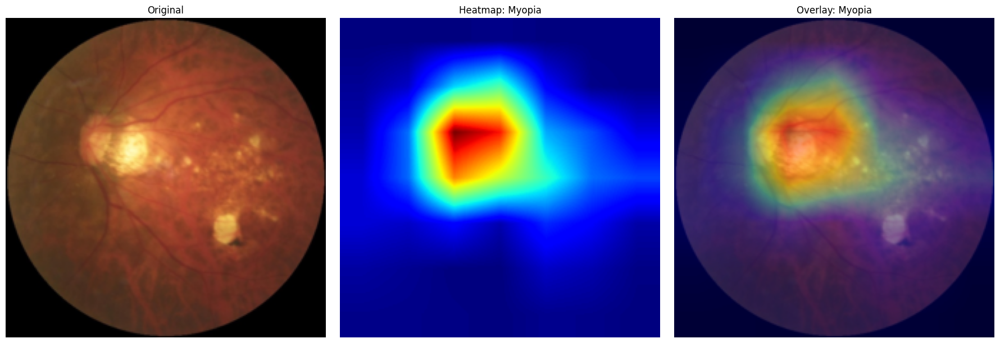

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/35_left.jpg
True: ['Myopia']
Pred: ['Normal', 'Glaucoma', 'Myopia']

Probabilities:
        Normal: 0.5861
      Diabetes: 0.0914
      Glaucoma: 0.5390
      Cataract: 0.2980
           AMD: 0.3496
  Hypertension: 0.4185
        Myopia: 0.7253
         Other: 0.2792

Example 1/10
Class: Normal
Index found: 64


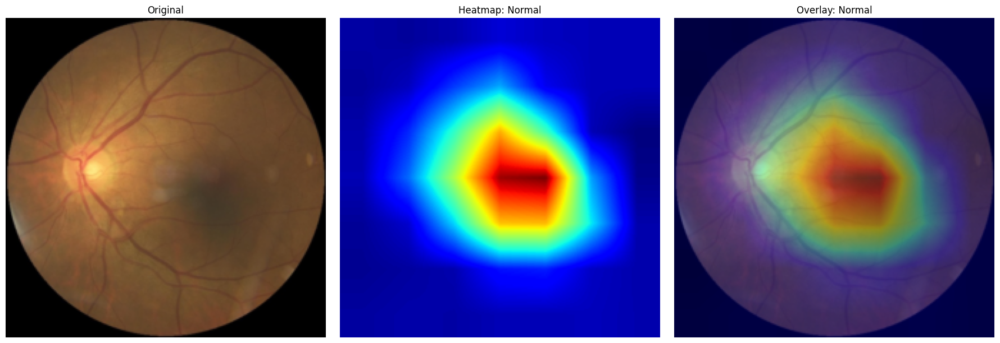

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/191_left.jpg
True: ['Normal']
Pred: ['Normal']

Probabilities:
        Normal: 0.9747
      Diabetes: 0.0463
      Glaucoma: 0.2760
      Cataract: 0.2731
           AMD: 0.2648
  Hypertension: 0.4538
        Myopia: 0.4786
         Other: 0.1049

Example 2/10
Class: Diabetes
Index found: 13


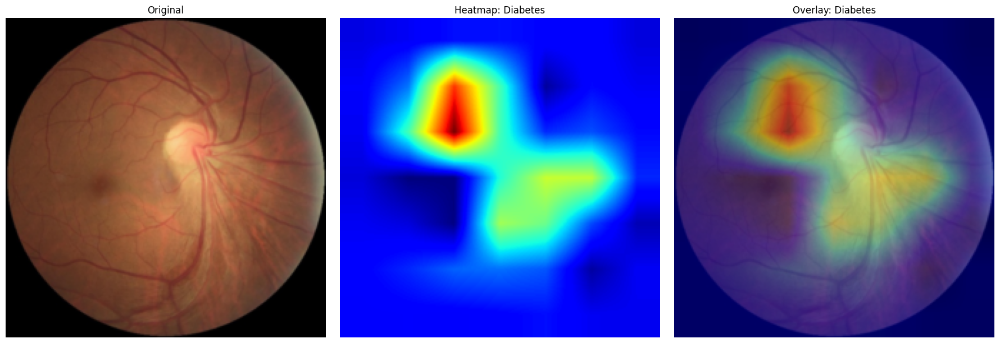

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/37_right.jpg
True: ['Diabetes', 'Other']
Pred: ['Diabetes', 'AMD']

Probabilities:
        Normal: 0.3585
      Diabetes: 0.8195
      Glaucoma: 0.2594
      Cataract: 0.2699
           AMD: 0.5061
  Hypertension: 0.4753
        Myopia: 0.3007
         Other: 0.3659

Example 3/10
Class: Glaucoma
Index found: 30


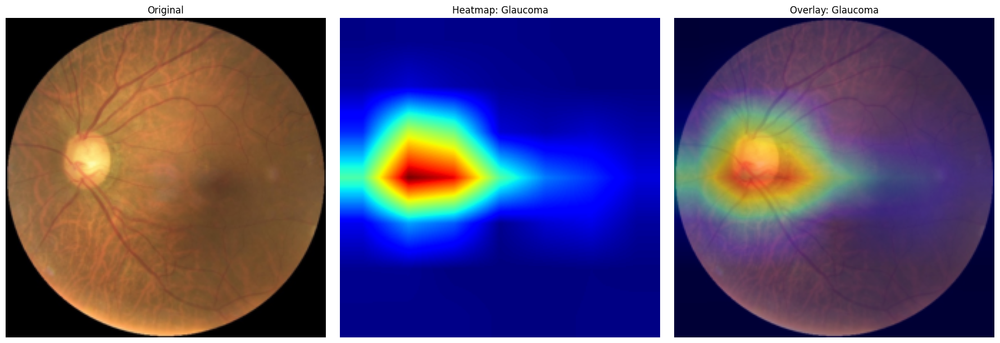

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/95_left.jpg
True: ['Glaucoma', 'Hypertension']
Pred: ['Glaucoma']

Probabilities:
        Normal: 0.2428
      Diabetes: 0.1898
      Glaucoma: 0.9822
      Cataract: 0.2074
           AMD: 0.2975
  Hypertension: 0.3209
        Myopia: 0.3584
         Other: 0.3216

Example 4/10
Class: Cataract
Index found: 0


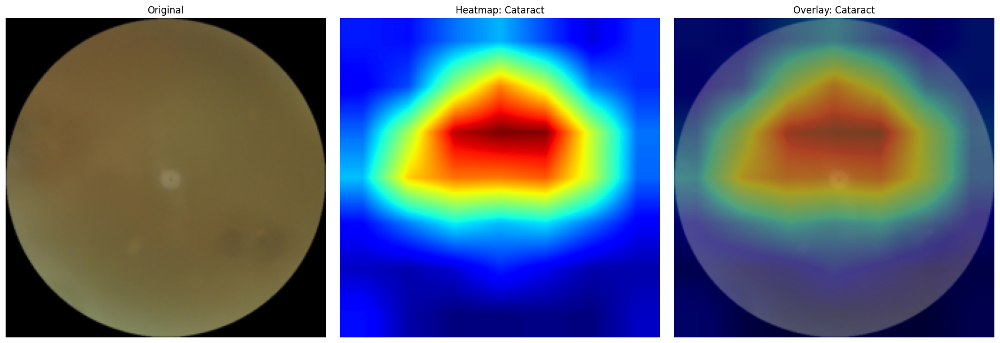

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/0_left.jpg
True: ['Cataract']
Pred: ['Cataract']

Probabilities:
        Normal: 0.0556
      Diabetes: 0.2222
      Glaucoma: 0.3161
      Cataract: 0.9954
           AMD: 0.3481
  Hypertension: 0.4140
        Myopia: 0.4959
         Other: 0.3318

Example 5/10
Class: AMD
Index found: 14


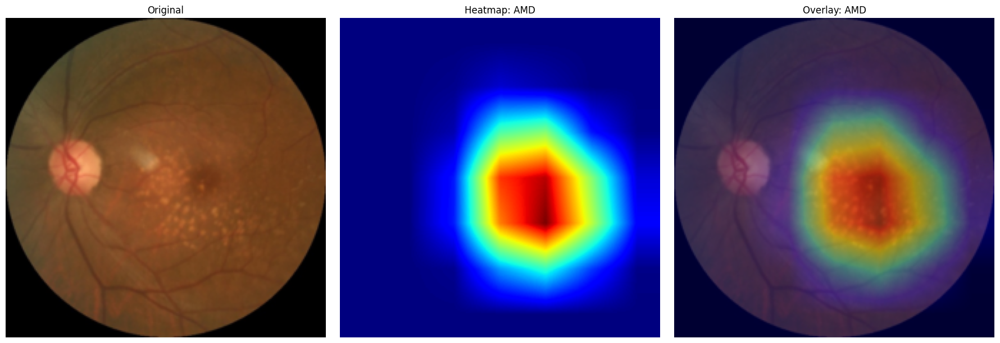

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/48_left.jpg
True: ['AMD']
Pred: ['AMD']

Probabilities:
        Normal: 0.0522
      Diabetes: 0.0296
      Glaucoma: 0.2108
      Cataract: 0.2934
           AMD: 0.9989
  Hypertension: 0.4312
        Myopia: 0.3574
         Other: 0.1101

Example 6/10
Class: Hypertension
Index found: 6


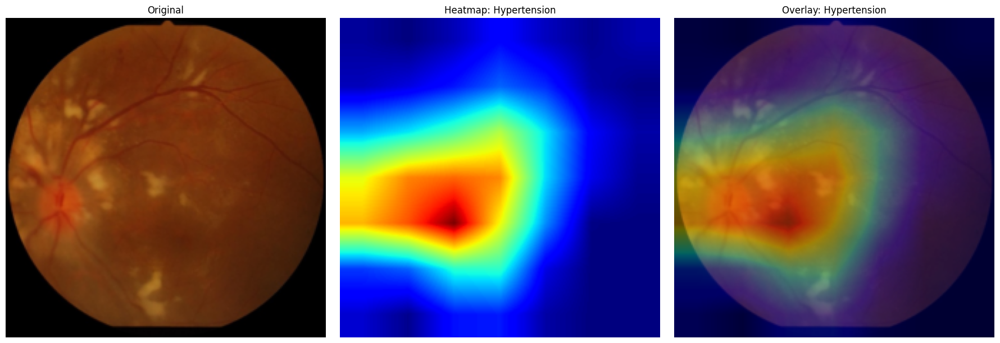

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/28_left.jpg
True: ['Hypertension']
Pred: ['Diabetes', 'Hypertension']

Probabilities:
        Normal: 0.0655
      Diabetes: 0.6633
      Glaucoma: 0.2100
      Cataract: 0.1915
           AMD: 0.3835
  Hypertension: 0.9424
        Myopia: 0.3169
         Other: 0.4013

Example 7/10
Class: Myopia
Index found: 4


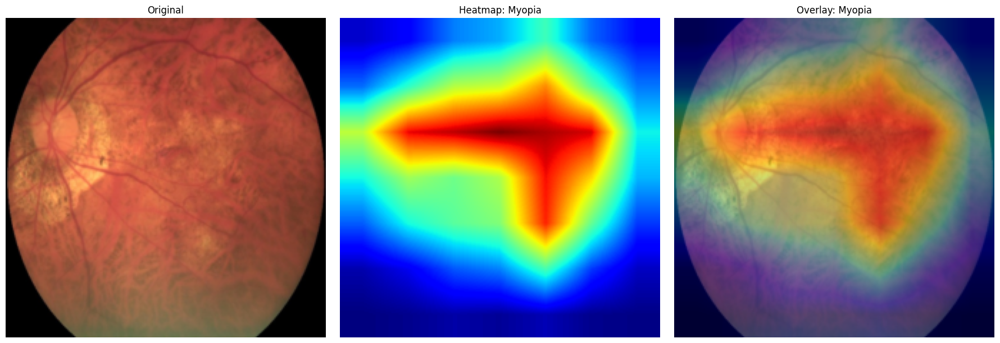

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/18_left.jpg
True: ['Myopia']
Pred: ['Normal', 'Myopia']

Probabilities:
        Normal: 0.7078
      Diabetes: 0.1753
      Glaucoma: 0.2835
      Cataract: 0.2547
           AMD: 0.2856
  Hypertension: 0.4693
        Myopia: 0.9645
         Other: 0.0645

Example 8/10
Class: Other
Index found: 9


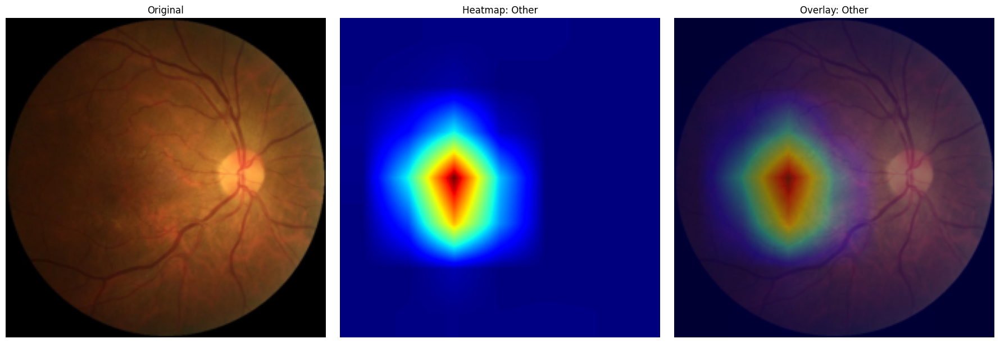

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/33_right.jpg
True: ['Other']
Pred: ['Diabetes', 'AMD', 'Other']

Probabilities:
        Normal: 0.1616
      Diabetes: 0.5248
      Glaucoma: 0.2725
      Cataract: 0.3117
           AMD: 0.7807
  Hypertension: 0.3977
        Myopia: 0.3062
         Other: 0.8647

Example 9/10
Class: Normal
Index found: 64


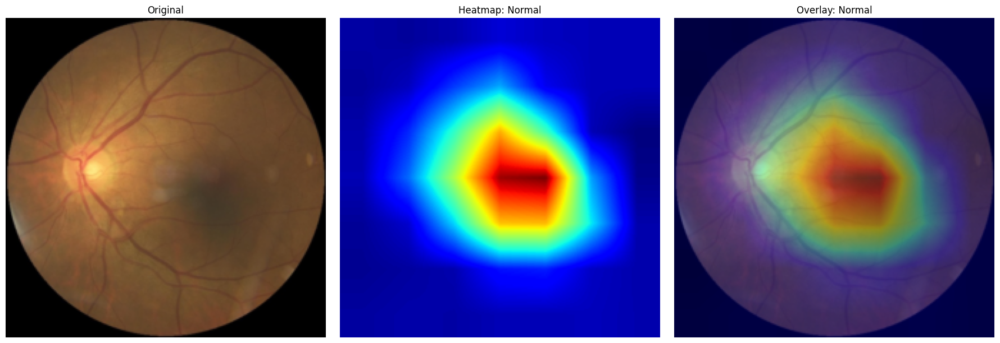

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/191_left.jpg
True: ['Normal']
Pred: ['Normal']

Probabilities:
        Normal: 0.9747
      Diabetes: 0.0463
      Glaucoma: 0.2760
      Cataract: 0.2731
           AMD: 0.2648
  Hypertension: 0.4538
        Myopia: 0.4786
         Other: 0.1049

Example 10/10
Class: Diabetes
Index found: 13


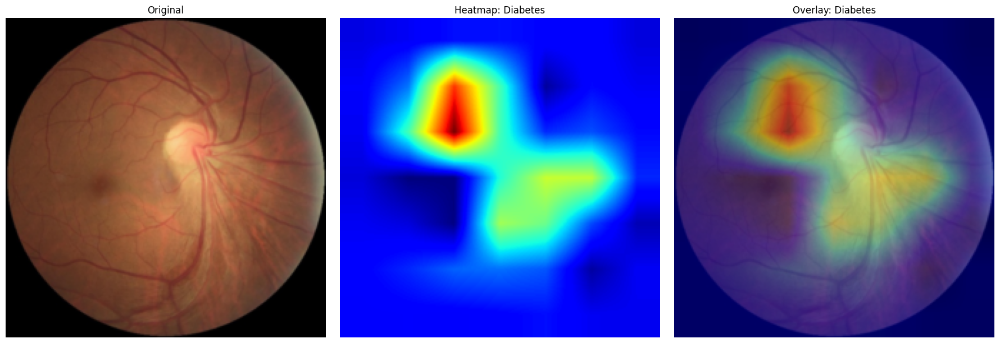

Image: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/preprocessed_images/37_right.jpg
True: ['Diabetes', 'Other']
Pred: ['Diabetes', 'AMD']

Probabilities:
        Normal: 0.3585
      Diabetes: 0.8195
      Glaucoma: 0.2594
      Cataract: 0.2699
           AMD: 0.5061
  Hypertension: 0.4753
        Myopia: 0.3007
         Other: 0.3659


In [23]:
# =========================
# GRAD-CAM (ALL-IN-ONE CELL)
# =========================

import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# -------- CLASS NAMES --------
CLASS_NAMES = ["Normal", "Diabetes", "Glaucoma", "Cataract", "AMD", "Hypertension", "Myopia", "Other"]

IMAGENET_MEAN = np.array([0.485, 0.456, 0.406])
IMAGENET_STD = np.array([0.229, 0.224, 0.225])

def unnormalize_image(tensor):
    img = tensor.detach().cpu().numpy().transpose(1, 2, 0)
    img = img * IMAGENET_STD + IMAGENET_MEAN
    return np.clip(img, 0, 1)

# -------- GRAD-CAM CLASS --------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.activations = None
        self.gradients = None

        target_layer.register_forward_hook(self.save_activation)
        target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, inp, out):
        self.activations = out

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def generate(self, x, class_idx):
        self.model.eval()
        self.model.zero_grad()

        logits = self.model(x)
        score = logits[0, class_idx]
        score.backward(retain_graph=True)

        grads = self.gradients
        acts = self.activations

        weights = grads.mean(dim=(2, 3), keepdim=True)
        cam = (weights * acts).sum(dim=1, keepdim=True)
        cam = F.relu(cam)

        cam = F.interpolate(cam, size=x.shape[-2:], mode="bilinear", align_corners=False)
        cam = cam[0, 0].detach().cpu().numpy()

        if cam.max() > cam.min():
            cam = (cam - cam.min()) / (cam.max() - cam.min())
        else:
            cam = np.zeros_like(cam)

        probs = torch.sigmoid(logits).detach().cpu().numpy()[0]
        return cam, probs

# -------- INITIALISE --------
grad_cam = GradCAM(model, model.features[-1])

# -------- FIND GOOD EXAMPLE --------
def find_example_for_class(target_class_idx, threshold=0.5):
    for i in range(len(val_samples)):
        sample = val_samples[i]
        if sample["label"][target_class_idx] != 1:
            continue

        pil_img = Image.open(sample["path"]).convert("RGB")
        x = val_tfm(pil_img).unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            probs = torch.sigmoid(model(x))[0].cpu().numpy()

        if probs[target_class_idx] >= threshold:
            return i
    return None

# -------- MAIN FUNCTION --------
def run_gradcam(sample_idx=None, class_idx=None, threshold=0.5):
    if sample_idx is None:
        sample_idx = 0

    sample = val_samples[sample_idx]
    img_path = sample["path"]
    true_label = sample["label"]

    pil_img = Image.open(img_path).convert("RGB")
    x = val_tfm(pil_img).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        probs = torch.sigmoid(model(x))[0].cpu().numpy()

    if class_idx is None:
        class_idx = int(np.argmax(probs))

    cam, probs = grad_cam.generate(x, class_idx)
    img_np = unnormalize_image(x[0])

    true_positive = [CLASS_NAMES[i] for i, v in enumerate(true_label) if v == 1]
    pred_positive = [CLASS_NAMES[i] for i, p in enumerate(probs) if p >= threshold]

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(img_np)
    axes[0].set_title("Original")
    axes[0].axis("off")

    axes[1].imshow(cam, cmap="jet")
    axes[1].set_title(f"Heatmap: {CLASS_NAMES[class_idx]}")
    axes[1].axis("off")

    axes[2].imshow(img_np)
    axes[2].imshow(cam, cmap="jet", alpha=0.4)
    axes[2].set_title(f"Overlay: {CLASS_NAMES[class_idx]}")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

    print(f"Image: {img_path}")
    print(f"True: {true_positive if true_positive else ['None']}")
    print(f"Pred: {pred_positive if pred_positive else ['None']}")
    print("\nProbabilities:")
    for i, p in enumerate(probs):
        print(f"{CLASS_NAMES[i]:>14}: {p:.4f}")

# =========================
# RUN EXAMPLES
# =========================


# Auto best example for Glaucoma (2)
idx = find_example_for_class(target_class_idx=2)
print("Glaucoma example index:", idx)
run_gradcam(sample_idx=idx, class_idx=2)

# Auto best example for AMD (4)
idx = find_example_for_class(target_class_idx=4)
print("AMD example index:", idx)
run_gradcam(sample_idx=idx, class_idx=4)

# Or random image:
run_gradcam(sample_idx=10)

# =========================
# SHOW MULTIPLE EXAMPLES (10)
# =========================

NUM_EXAMPLES = 10
threshold = 0.5

for i in range(NUM_EXAMPLES):
    class_idx = i % len(CLASS_NAMES)  # cycle through classes

    idx = find_example_for_class(target_class_idx=class_idx, threshold=threshold)

    print("\n" + "="*50)
    print(f"Example {i+1}/{NUM_EXAMPLES}")
    print(f"Class: {CLASS_NAMES[class_idx]}")
    print(f"Index found: {idx}")

    if idx is not None:
        run_gradcam(sample_idx=idx, class_idx=class_idx, threshold=threshold)
    else:
        print(f"No suitable example found for class: {CLASS_NAMES[class_idx]}")

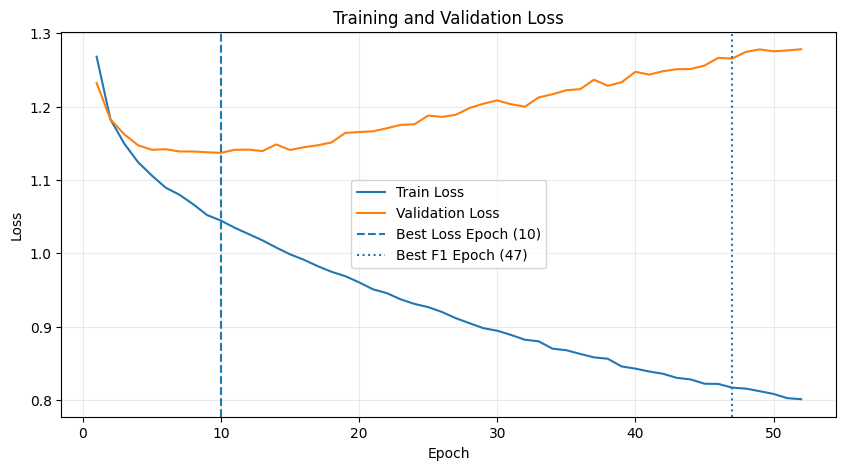

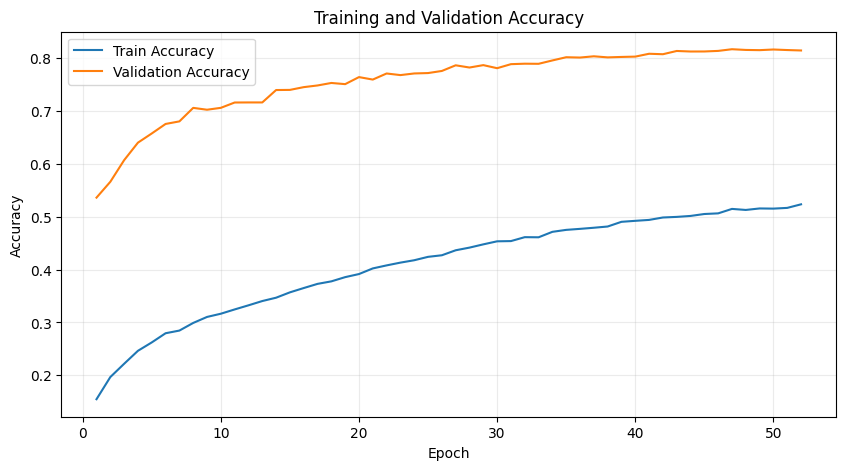

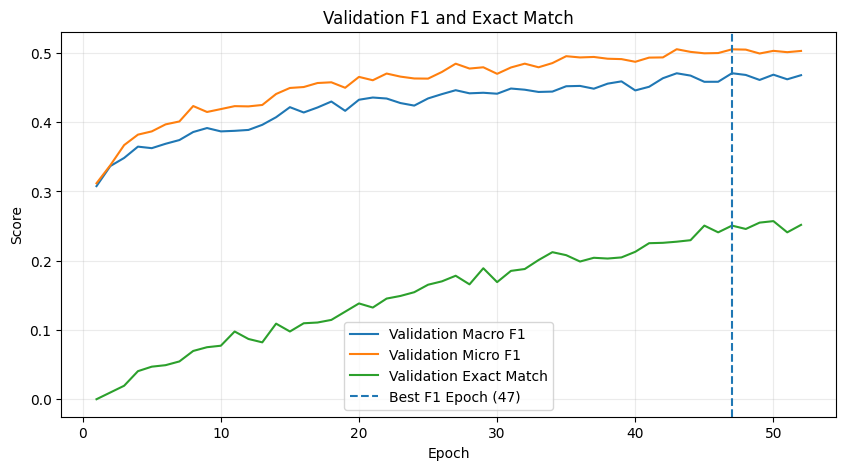

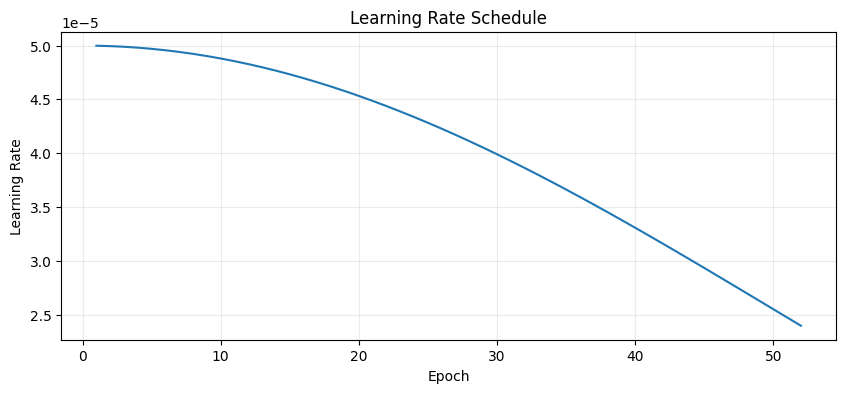

In [24]:
history_df = pd.DataFrame(history)

plt.figure(figsize=(10, 5))
plt.plot(history_df["epoch"], history_df["train_loss"], label="Train Loss")
plt.plot(history_df["epoch"], history_df["val_loss"], label="Validation Loss")
plt.axvline(best_epoch_loss, linestyle="--", label=f"Best Loss Epoch ({best_epoch_loss})")
plt.axvline(best_epoch_f1, linestyle=":", label=f"Best F1 Epoch ({best_epoch_f1})")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(alpha=0.25)
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(history_df["epoch"], history_df["train_acc"], label="Train Accuracy")
plt.plot(history_df["epoch"], history_df["val_acc"], label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()
plt.grid(alpha=0.25)
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(history_df["epoch"], history_df["val_macro_f1"], label="Validation Macro F1")
plt.plot(history_df["epoch"], history_df["val_micro_f1"], label="Validation Micro F1")
plt.plot(history_df["epoch"], history_df["val_exact_match"], label="Validation Exact Match")
plt.axvline(best_epoch_f1, linestyle="--", label=f"Best F1 Epoch ({best_epoch_f1})")
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Validation F1 and Exact Match")
plt.legend()
plt.grid(alpha=0.25)
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(history_df["epoch"], history_df["lr"])
plt.xlabel("Epoch")
plt.ylabel("Learning Rate")
plt.title("Learning Rate Schedule")
plt.grid(alpha=0.25)
plt.show()